In [1]:
BATCH_SIZE = 1024

PAD_SIZE = 80
TARGET_LABELS = [
    "Improvement",
    "Solved",
    #"AreaRatio",
    #"Stacks"
]

SEED = 3093453

# Preprocessing

## Load Packages and Data

In [2]:
import os
import sys

import numpy as np
import pandas as pd
import polars as pl

import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

# Random Seeds
np.random.seed(SEED)
tf.random.set_seed(SEED)



# Cosmetics
np.set_printoptions(
    edgeitems=30,
    linewidth=100_000,
    suppress=True
    )

sns.set(
    context="talk",
    style="darkgrid"
)


cwd = os.getcwd()
cwd, _ = os.path.split(cwd)

In [3]:
import tensorflow as tf
from tensorflow import keras

train_samples = os.path.join(cwd, "data", "train+val") # 116586 + 489623 = 606209
test_samples = os.path.join(cwd, "data", "test", "2D", "MIP")

train_dataset = keras.preprocessing.text_dataset_from_directory(
    directory = train_samples,
    labels = None,
    batch_size = BATCH_SIZE,
    max_length = None,
    shuffle = True,
    seed = SEED,
    validation_split = 0.05,
    subset = "training",
    follow_links = False
)

val_dataset = keras.preprocessing.text_dataset_from_directory(
    directory = train_samples,
    labels = None,
    batch_size = BATCH_SIZE,
    max_length = None,
    shuffle = True,
    seed = SEED,
    validation_split = 0.05,
    subset = "validation",
    follow_links = False
)



Found 606209 files belonging to 1 classes.
Using 575899 files for training.


2024-02-16 15:10:48.910025: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-02-16 15:10:48.910060: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-02-16 15:10:48.910063: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-02-16 15:10:48.910278: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-02-16 15:10:48.910304: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 606209 files belonging to 1 classes.
Using 30310 files for validation.


In [4]:
for X in train_dataset.take(1):
    pass

df = pl.DataFrame({"raw": X.numpy().astype(str)})
print(df[0, 0])

dataset: X
instance: CI2
+-----------+
2D Packing MIP with Time Limit 2.72824432791727 [s] in Truck P187403221
Stack 0 with items: ['0090016800_08062023049937', '0090016800_08062023049698', '0090016800_08062023046855']
Stack 1 with items: ['0090016800_08062023042408', '0090016800_08062023042408', '0090016800_08062023042408']
Stack 2 with items: ['0090016800_08062023042408', '0090016800_08062023040754', '0090016800_08062023042408']
Stack 3 with items: ['0090016800_08062023039770', '0090016800_08062023031646', '0090016800_08062023031646']
Stack 4 with items: ['0090016800_08062023034277', '0090016800_08062023025612', '0090016800_08062023034277']
Stack 5 with items: ['0090016800_08062023025612', '0090016800_08062023025612', '0090016800_08062023025612']
Stack 6 with items: ['0090016800_08062023023781', '0090016800_08062023021926', '0090016800_08062023021538']
Stack 7 with items: ['0090016800_08062023021538', '0090016800_08062023021538', '0090016800_08062023021538']
Stack 8 with items: ['009

## Loading CSVs

In [5]:
folder = "truck-item-infos"
file = "items.csv"

item_path = os.path.join(cwd, folder, file)
items = pl.read_csv(source = item_path);

items = items.lazy().with_columns([
    (pl.col("Item ident").alias("item_id")),
    (pl.col("Length") / 1000), # mm to m
    (pl.col("Width") / 1000),  # mm to m
    (pl.col("Height") / 1000), # mm to m
    (pl.col("Nesting height") / 1000), # mm to m
    (pl.col("Weight") / 1000), # kg to tons
    (pl.col("Forced orientation") == "lengthwise").alias("ForcedLength"),
    (pl.col("Forced orientation") == "widthwise").alias("ForcedWidth"),
    ((pl.col("Height") - pl.col("Nesting height")) / 1000).alias("NestedHeight"),
    pl.col("dataset").str.extract("([A-Z])")
]).drop([
    "Forced orientation", "Max stackability", "Inventory cost",
    "Earliest arrival time", "Latest arrival time", "Number of items",
    "instance_id",
    "Stackability code",
    "Item ident", # drop because of rename earlier
    # Unnecassary columns
    "Product code",
    "Package",
    "Plant code",
    "Product code",
    "Package code",
    "NestedHeight"
]).unique()

items.collect()

Supplier code,Supplier dock,Plant dock,Length,Width,Height,Weight,Nesting height,dataset,instance,item_id,ForcedLength,ForcedWidth
i64,str,str,f64,f64,f64,f64,f64,str,str,str,bool,bool
679301,null,"""169GB-20""",2.4,1.2,1.9,0.518208,0.045,"""C""","""BY""","""0090016900_270…",false,false
2695000,null,"""GRF1""",2.4,1.2,0.76,0.2542,0.045,"""C""","""BY""","""0090016900_270…",false,false
40562603,null,"""169GD-60""",1.2,1.0,0.975,0.147128,0.045,"""C""","""BY""","""0090016900_270…",false,false
24099001,null,"""169GB-30""",0.78,0.57,0.478,0.0819,0.047,"""C""","""BY""","""0090016900_270…",false,true
2573225,null,"""169GB-10""",1.6,1.2,0.75,0.3353,0.045,"""C""","""BY""","""0090016900_270…",false,false
90016100,"""F4""","""GRD1""",1.7,1.17,0.7,0.475,0.045,"""C""","""BY""","""0090016900_270…",false,false
1925700,null,"""GRF1""",2.4,2.1,1.49,0.5259,0.045,"""C""","""BY""","""0090016900_270…",false,false
90016100,"""F4""","""GRD1""",1.7,1.17,0.7,0.475,0.045,"""C""","""BY""","""0090016900_270…",false,false
6193205,null,"""169GD-20""",2.35,1.8,1.45,0.36948,0.045,"""C""","""BY""","""0090016900_270…",false,false


In [6]:
file = "trucks.csv"

truck_path = os.path.join(cwd, folder, file)

truck_clms = ["Id truck", "dataset", "instance",
              "Supplier code", "Supplier dock", "Plant dock",
              "Supplier loading order", "Supplier dock loading order", "Plant dock loading order",
             ]

truck_stops = (
    pl.read_csv(source = truck_path, columns = truck_clms)
    .lazy()
    .rename({"Id truck": "truck_id"})
    .sort(["dataset", "instance", "truck_id"])
    .with_columns([pl.col("dataset").str.extract("(\w)")])
    .unique()
)
truck_stops.collect()

Supplier code,Supplier loading order,Supplier dock,Supplier dock loading order,Plant dock,Plant dock loading order,truck_id,dataset,instance
i64,i64,str,i64,str,i64,str,str,str
29908700,1,null,1,"""X4""",1,"""P187730401""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P187730403""","""A""","""AS"""
62059600,1,null,1,"""X0""",1,"""P187731005""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P188721401""","""A""","""AS"""
29908700,1,null,1,"""X4""",1,"""P188730405""","""A""","""AS"""
24414600,1,null,1,"""X1""",1,"""P189717001""","""A""","""AS"""
62059600,1,null,1,"""X0""",1,"""P190731051""","""A""","""AS"""
29918200,1,null,1,"""X1""",2,"""P192717701""","""A""","""AS"""
40010000,1,null,1,"""X1""",1,"""P192717901""","""A""","""AS"""


In [7]:
file = "trucks.csv"

truck_path = os.path.join(cwd, folder, file)

truck_clms = ["Id truck", "dataset", "instance",
              "Length", "Width", "Max weight",
              "EMmm", "EMmr"
             ]

truck_dims = (
    pl.read_csv(source = truck_path, columns = truck_clms)
    .lazy()
    .rename({"Id truck": "truck_id", "Max weight": "Weight"})
    .sort(["dataset", "instance", "truck_id"])
    .with_columns([pl.col("dataset").str.extract("(\w)")])
    .unique()
)

truck_dims = truck_dims.with_columns([
    (pl.col("Length") / 1000),
    (pl.col("Width") / 1000),
    (pl.col("Weight") / 1000),
    (pl.col("EMmm") / 1000),
    (pl.col("EMmr") / 1000),
])

truck_dims.collect()

truck_id,Length,Width,Weight,EMmm,EMmr,dataset,instance
str,f64,f64,f64,f64,f64,str,str
"""P187731005""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P187731305""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188730407""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P188731301""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189730403""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189730407""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P189731005""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P192731001""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""
"""P192731801""",14.94,2.5,24.0,12.0,31.5,"""A""","""AS"""


## Preprocessing Functions:

In [8]:
import sys
sys.path.append("..")

from utils.preprocessing import input_output_generation

In [9]:
cx, cy = input_output_generation(
    X,
    #target_labels=TARGET_LABELS,
    pad_size=PAD_SIZE,
    shuffle=False,
    items=items,
    truck_stops=truck_stops,
    truck_dims=truck_dims,
)

In [10]:
cx[0][0, :40]

array([[ 0.78      ,  0.57      ,  0.4584    ,  0.        ,  1.        ,  2.        ,  1.        ,  0.10000014,  0.16000009],
       [ 1.2       ,  1.        ,  1.6682    ,  0.        ,  0.        ,  3.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  1.00926   ,  0.        ,  0.        ,  3.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  1.05024   ,  0.        ,  0.        ,  3.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  1.07192   ,  0.        ,  0.        ,  3.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  1.0554    ,  0.        ,  0.        ,  2.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  1.0554    ,  0.        ,  0.        ,  2.        ,  0.        ,  0.03999996,  0.44000006],
       [ 1.2       ,  1.        ,  0.81656   ,  0.        ,  0.        ,  3.        ,  0.        ,  0.03999996,  0.440

# DNN

### Optimizer, Losses and Metrics

In [11]:
# Learning Rate
initial_lr = 10e-3 # 10e-3
lr_decay = 0.9995

# Optimizer
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = initial_lr)

In [12]:
loss_solved = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=2,
    alpha = cy[0].mean(),
    name='solved_focal_loss'
)

loss_improvement = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=1.5,
    alpha = cy[1].mean(),
    name='improvement_focal_loss'
)

loss_area_ratio = tf.keras.losses.BinaryCrossentropy(
    name='area_ratio_crossentropy'
)



loss_stacks = tf.keras.losses.BinaryFocalCrossentropy(
    gamma=6,
    alpha = cy[-1].mean(),
    name='stacks_focal_loss'
)

for i, target in enumerate(TARGET_LABELS):
    print(f"{target} Prevalence: {cy[i].mean():.1%}")

Improvement Prevalence: 37.1%
Solved Prevalence: 47.4%


In [13]:
target_loss_objects = {
    "Solved": loss_solved,
    "Improvement": loss_improvement,
    "AreaRatio": loss_area_ratio,
    "Stacks": loss_stacks,
}

loss_objects = [target_loss_objects[target] for target in TARGET_LABELS]
mean_losses = [tf.keras.metrics.Mean(name=target) for target in TARGET_LABELS]

In [14]:
all_target_metrics: list[list[tf.keras.metrics]] = {
    "Solved": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
    "Improvement": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
    "AreaRatio": [
        keras.metrics.RootMeanSquaredError(name="RMSE"),
        keras.metrics.MeanAbsoluteError(name="MAE")
    ],
    "Stacks": [
        tf.keras.metrics.Precision(name = "PRC"),
        tf.keras.metrics.Recall(name = "SNS"),
        tf.keras.metrics.AUC(curve='PR', name="AUC"),
        tf.keras.metrics.BinaryAccuracy(name = "ACC")
    ],
}

all_metrics = [all_target_metrics[target] for target in TARGET_LABELS]

## Architecture

In [15]:
from tensorflow.keras.layers import Masking, BatchNormalization, MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.layers import Add, Dense, Input, Reshape, Permute, Lambda, Concatenate
from keras import backend as K
from tensorflow.keras import Model

from utils.DNN.model_layers import TransformerEncoder



N_FEATURES = cx[0].shape[-1]

def build_model(
    target_labels: list[str]=["Improvement"],
    n_features: int=9,
    n_blocks: int=3,
    num_heads: int=3,
    use_bias: bool=True,
    upscale_factor: float=1,
    use_PreLN: bool=True,
    split_last_layer: bool=False,
    encoder_dropout: float=0.1,
    activation: str="gelu", # "relu" "gelu" "selu" "swish"
    bias_regularizer=None,
    pad_size: int=80
) -> Model:
    """
    
    """

    # Input
    input_stack_level = Input(shape=(pad_size, n_features), name="StackLevelInputFeatures", dtype=tf.float16,)
    input_time_limit = Input(shape=(1), name="TimeLimitInput", dtype=tf.float16,)
    inputs = [input_stack_level, input_time_limit]
    
    # Masking padded input
    masking_layer = Masking(
        mask_value=0,
        input_shape=(pad_size, n_features),
        dtype=tf.float16,
        name="MaskingLayer"
    )
    x = masking_layer(input_stack_level)

    #batch_norm_layer = BatchNormalization(name="BatchNormalizationLayer")
    #x = batch_norm_layer(masking_layer)
    
    key_dim = int(n_features/num_heads)
    # Encoder Block
    for i in range(1, n_blocks+1):
        # Self attention with add and layer norm
        self_attention_layer = TransformerEncoder(
            num_heads=num_heads,
            #key_dim=int(N_FEATURES/num_heads),
            activation=activation,
            units = N_FEATURES,
            upscale_factor=upscale_factor,
            dropout=encoder_dropout,
            use_bias=use_bias,
            use_PreLN=use_PreLN,
            bias_regularizer=bias_regularizer,
            idx = i,
        )
        x, _ = self_attention_layer(x)
    
    final_layer_norm = LayerNormalization(name="FinalLayerNorm")
    x = final_layer_norm(x)

    if split_last_layer:
        self_attention_layer_solved = TransformerEncoder(
            num_heads=num_heads, #key_dim=key_dim,
            activation=activation,
            units = N_FEATURES,
            upscale_factor=upscale_factor,
            dropout=encoder_dropout,
            use_bias=use_bias,
            use_PreLN=use_PreLN,
            bias_regularizer=bias_regularizer,
            idx="Solved"
        )
        attention_solved, _ = self_attention_layer_solved(x)
        attention_solved = final_layer_norm(attention_solved)
        
        self_attention_layer_improvement = TransformerEncoder(
            num_heads=num_heads, #key_dim=key_dim,
            activation=activation,
            units = N_FEATURES,
            upscale_factor=upscale_factor,
            dropout=encoder_dropout,
            use_bias=use_bias,
            use_PreLN=use_PreLN,
            bias_regularizer=bias_regularizer,
            idx="Improvement",
        )
        attention_improvement, _ = self_attention_layer_improvement(x)
        attention_improvement = final_layer_norm(attention_improvement)

        self_attention_layer_area_ratio = TransformerEncoder(
            num_heads=num_heads, #key_dim=key_dim,
            activation=activation,
            units = N_FEATURES,
            upscale_factor=upscale_factor,
            dropout=encoder_dropout,
            use_bias=use_bias,
            use_PreLN=use_PreLN,
            bias_regularizer=bias_regularizer,
            idx="AreaRatio",
        )
        
        attention_area_ratio, _ = self_attention_layer_area_ratio(x)
        attention_area_ratio = final_layer_norm(attention_area_ratio)




    
    
    # After Attention, reduce to single dimension
    add_across_dim = Lambda(
        lambda x: K.sum(x, axis=1)/PAD_SIZE**1,
        output_shape=lambda s: (s[0], s[2]),
        name = "ReduceStackDimensionViaSummation"
    )
    
    reshape = Lambda(lambda x: tf.squeeze(x), name="Output")
    
    # Pipe Attention directly into missing stack prediction:
    
    output_stacks = Dense(1, activation='sigmoid', name = "PredictionStacks")
    xx = output_stacks(x)
    output_stacks = reshape(xx)
    
    
    
    # Standardize the Time Limit
    # - The time limit ranges from 0 to 30,
    # - (tl - 15)/5 should roughly normalize
    
    normalize_time_limit = Lambda(
        lambda x: (x-15)/5,
        name = "StandardizeTimeLimit"
    )
    input_time_limit = normalize_time_limit(input_time_limit)
    concatenate_layer = Concatenate(axis=-1, name=f"ConcatenateLayer")
    #x = concatenate_layer([x, input_time_limit])
    
    
    
    
    
    if split_last_layer:
        attention_solved = add_across_dim(attention_solved)
        attention_improvement = add_across_dim(attention_improvement)
        attention_area_ratio = add_across_dim(attention_area_ratio)
    else:
        x = add_across_dim(x)

    if split_last_layer:
        xx = concatenate_layer([attention_solved, input_time_limit])
    else:
        xx = concatenate_layer([x, input_time_limit])
    fully_connected_layer_solved = Dense(units=n_features+1, activation=activation,name=f"FullyConnectedLayerSolved")
    xx = fully_connected_layer_solved(xx)
    output_solved = Dense(1, activation='sigmoid', name = "PredictionSolved")
    xx = output_solved(xx)
    output_solved = reshape(xx)



    if split_last_layer:
        xx = concatenate_layer([attention_improvement, input_time_limit])
    else:
        xx = concatenate_layer([x, input_time_limit])
    fully_connected_layer_improvement = Dense(units=n_features+1, activation=activation,name=f"FullyConnectedLayerImprovement")
    xx = fully_connected_layer_improvement(xx)
    output_improvement = Dense(1, activation='sigmoid', name = "PredictionImprovement")
    xx = output_improvement(xx)
    output_improvement = reshape(xx)

    if split_last_layer:
        xx = concatenate_layer([attention_area_ratio, input_time_limit])
    else:
        xx = concatenate_layer([x, input_time_limit])
    fully_connected_layer_area_ratio = Dense(units=n_features+1, activation=activation,name=f"FullyConnectedLayerAreaRatio")
    xx = fully_connected_layer_area_ratio(xx)
    output_area_ratio = Dense(1, activation='sigmoid', name = "PredictionAreaRatio")
    xx = output_area_ratio(xx)
    output_area_ratio = reshape(xx)
    
    
    
    
    target_outputs = {
        "Solved": output_solved,
        "Improvement": output_improvement,
        "AreaRatio": output_area_ratio,
        "Stacks": output_stacks
    }
    
    outputs = [target_outputs[target] for target in target_labels]
    
    model = Model(
        inputs=inputs,
        outputs=outputs,
    )
    
    return model

## Model Parameters

In [16]:
N_FEATURES = cx[0].shape[-1]

n_blocks=6
num_heads=4

# Learning Rate
initial_lr = 10e-3 # 10e-3
lr_decay = 0.9995

# Optimizer
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = initial_lr)

In [17]:
from keras import backend as K
model_path = os.path.join(cwd, "models", "FinalModelTraining-17.tf")
model = tf.keras.models.load_model(model_path)
model

### Model Architecture Inspection:

In [18]:
_ = model(cx) # just check if it works
model.summary()

2024-02-16 15:11:15.639197: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 StackLevelInputFeatures (I  [(None, 80, 9)]              0         []                            
 nputLayer)                                                                                       
                                                                                                  
 MaskingLayer (Masking)      (None, 80, 9)                0         ['StackLevelInputFeatures[0][0
                                                                    ]']                           
                                                                                                  
 transformer_encoder (Trans  ((None, 80, 9),              613       ['MaskingLayer[0][0]']        
 formerEncoder)               (None, 4, 80, 80))                                              

In [19]:
for file_format in ["png", "jpg", "pdf",]:
    path = os.path.join(cwd, "plots", "2024-01-07-FinalModelTraining-Train+Val", f"FinalModelArchitecture.{file_format}")
    tf.keras.utils.plot_model(
        model,
        to_file=path,
        show_shapes=True
    )    

## Training Process Functions

In [20]:
def geometric_decay(epoch: int, initial_lr:float=10e-3, lr_decay:float=0.9) -> float:
    """
    Exponential decay learning rate schedule
    """
    return initial_lr * lr_decay**epoch

#xx = np.arange(5000)
#yy = geometric_decay(xx, lr_decay=0.9995)
#plt.plot(xx, yy);

In [21]:
def early_stopping(track:pd.DataFrame, patience: int=1, metric: str="Val-Loss", target: str="Improvement") -> bool:
    """
    Early Stopping if no improvement in the metrics after 'patience' epochs.

    Assumes that the metrics is a loss to be minimized.

    TODO:
    -----
    - include option to check for increases in metric rather than just decreases in loss
    """

    assert (type(patience) == int)
    assert (patience > 0)
    
    track = track.loc[(track["Metric"]==metric)&(track["Target"]==target), "Value"]
    
    current_value = track.iloc[-1]
    prior_values = track.tail(patience+1) # plus1 since, last value is 'current_value', would always return True

    # Check if there is an improvement
    #  check if the current value is better than
    #  any of the last patience values (excluding the current one)
    # Since the current value is included in the prior values
    #  we must not use geq!
    if np.any(prior_values > current_value) or (epoch < patience):
        # The current value is lower than past ones,
        # which in the case of loss constitutes an improvement
        return False
    else:
        print(f"Early Stopping after no Improvement in {metric} for {target} after {patience} epochs")
        return True

    
    

In [22]:
def print_status_bar(iteration, total, losses, all_metrics=None, training:bool=True):
    tabs = "\t\t\t\t\t\t\t\t\t\t\t\t\t\t"
    metrics = tabs.join([
        f"{TARGET_LABELS[i]:<12}\tLoss: {losses[i].result():.4f}" +
        "\t".join([
            f"{m.name:>10}: {m.result():.2%}"
            if m.name not in ["MAE", "RMSE"]
            else f"{m.name:>10}: {m.result():.4f}"
            for m in metrics
        ])
        for i, metrics in enumerate(all_metrics)
    ])
    
    if training:
        prefix="Training"
    else:
        prefix="Validation"
    
    print(f"\r{prefix}-Iteration: {iteration+1:0>3}/{total:<3}\tLR: {float(optimizer.lr):<1000.9f}" + metrics,
          end="")


In [23]:
@tf.function
def model_pass(model, inputs, targets, training):
    """
    Usual Tensorflow model passing of inputs throught the network.
    If in training mode, the optimizier can apply the gradients
    observed with GradientTape to the model parameters
    """
    
    with tf.GradientTape() as tape:
        
        outputs = model(inputs, training=training)

        # Single output is not a list!
        if type(outputs) != list:
            outputs = [outputs]
            
        losses = [l(t, o) for l,o,t in zip(loss_objects, outputs, targets)]
        
        if training:
            gradients = tape.gradient(losses, model.trainable_variables)
            optimizer.apply_gradients(zip(gradients, model.trainable_variables))
            
        for i, mean_loss in enumerate(mean_losses):
            if len(mean_losses) <= 1:
                mean_loss(losses)
            else:
                mean_loss(losses[i])
        
    return outputs


In [24]:
def run_epoch(model, dataset, target_labels, all_metrics:list[list[tf.keras.metrics]],
              epoch:int, history:pd.DataFrame, training:bool=True,
              shuffle:bool=True):
    """
    Single epoch, running several training steps over a dataset
    """

    for step, X_batch in enumerate(dataset):
        
        X_batch, y_batch = input_output_generation(
            X_batch,
            items=items,
            truck_stops=truck_stops,
            truck_dims=truck_dims,
            target_labels=target_labels,
            shuffle=shuffle,
            pad_size=PAD_SIZE
        )
        
        outputs = model_pass(model, X_batch, y_batch, training=training)
        
        for i, metrics in enumerate(all_metrics):
            for metric in metrics:
                metric(y_batch[i].reshape(-1), outputs[i].numpy().reshape(-1))
    
        print_status_bar(step, len(dataset), mean_losses, all_metrics, training=training)
    
        #### LEARNING RATE UPDATE ####
        if training:
            optimizer.lr = geometric_decay((epoch-1)*len(dataset)+step, initial_lr, lr_decay)
    
    print("\n")

    #### UPDATE METRICS
    for i, metrics in enumerate(all_metrics):
        for metric in metrics:
            data = pd.DataFrame({
                "Epoch": [epoch],
                "Target": [target_labels[i]],
                "Metric": [metric.name if training else f"Val-"+metric.name],
                "Value": [float(metric.result())],
            })
            history = pd.concat([history, data])
            metric.reset_states()

    for i, mean_loss in enumerate(mean_losses):
        data = pd.DataFrame({
            "Epoch": [epoch],
            "Target": [target_labels[i]],
            "Metric": ["Loss" if training else f"Val-"+"Loss"],
            "Value": [float(mean_loss.result())],
        })
        history = pd.concat([history, data])
        mean_loss.reset_states()
            
    return model, history

## Model Training

In [25]:
n_epochs = 30
patience = 3

clms = ["Epoch", "Target", "Metric", "Value"]

track = pd.DataFrame(columns=clms)
    
# get losses and metrics
#loss_objects = [target_loss_objects[target] for target in target_labels]
#mean_losses = [tf.keras.metrics.Mean(name=target) for target in target_labels]
#all_metrics = [all_target_metrics[target] for target in target_labels]
    
    
for epoch in range(1, n_epochs+1):
    
    print(f"Epoch {epoch:0>3}/{ n_epochs:0>3}")
        
    model, track = run_epoch(model, train_dataset, TARGET_LABELS,
                             all_metrics, epoch=epoch, history=track, training=True, shuffle=True)
    model, track = run_epoch(model, val_dataset, TARGET_LABELS,
                             all_metrics, epoch=epoch, history=track, training=False, shuffle=True)
        
    # make an intermediate save of the model
    model_path = os.path.join(cwd, "models", f"FinalModelTraining-Train+Val-{epoch}.tf")
    model.save(model_path, overwrite=True, save_format="tf")
        
    # Early Stopping
    if early_stopping(track, patience=patience):
        break
        
    print("-"*120)
    
        
        

Epoch 001/030
Training-Iteration: 563/563	LR: 0.007553529                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

/var/folders/j4/qmf6qmvd1gv0nctgx3m6jm3r0000gn/T/ipykernel_39680/1590848810.py:43: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  history = pd.concat([history, data])


Validation-Iteration: 030/30 	LR: 0.007549753                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-1.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 002/030
Training-Iteration: 563/563	LR: 0.005699877                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-2.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-2.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 003/030
Training-Iteration: 563/563	LR: 0.004301114                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-3.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-3.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 004/030
Training-Iteration: 563/563	LR: 0.003245611                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-4.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-4.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 005/030
Training-Iteration: 563/563	LR: 0.002449131                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-5.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-5.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 006/030
Training-Iteration: 563/563	LR: 0.001848109                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-6.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-6.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 007/030
Training-Iteration: 563/563	LR: 0.001394579                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-7.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-7.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 008/030
Training-Iteration: 563/563	LR: 0.001052346                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-8.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-8.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 009/030
Training-Iteration: 563/563	LR: 0.000794098                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-9.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-9.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 010/030
Training-Iteration: 563/563	LR: 0.000599225                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-10.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-10.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 011/030
Training-Iteration: 563/563	LR: 0.000452174                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-11.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-11.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 012/030
Training-Iteration: 563/563	LR: 0.000341209                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-12.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-12.tf/assets


------------------------------------------------------------------------------------------------------------------------
Epoch 013/030
Training-Iteration: 563/563	LR: 0.000257476                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-13.tf/assets


INFO:tensorflow:Assets written to: /Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-13.tf/assets


Early Stopping after no Improvement in Val-Loss for Improvement after 3 epochs


In [55]:
epoch=11

model_path = os.path.join(cwd, "models", f"FinalModelTraining-Train+Val-{epoch}.tf")
saved_model = tf.keras.models.load_model(model_path)
weight_path = os.path.join(cwd, "models", f"FinalModelTraining-Train+Val-{epoch}-weights.h5")
saved_model.save_weights(weight_path, overwrite=True)
weight_path

'/Users/fynn/Uni/MA/models/FinalModelTraining-Train+Val-11-weights.h5'

In [26]:
history = track\
    .pivot_table(
        values = ["Value"],
        columns=["Metric"],
        index=["Epoch", "Target"]
    )\
    .reset_index()\
    .set_index("Epoch", drop=True)

clms = history.columns
history.columns = [clm[i>=1] for i, clm in enumerate(clms)]
history

,Target,ACC,AUC,Loss,PRC,SNS,Val-ACC,Val-AUC,Val-Loss,Val-PRC,Val-SNS
Epoch,,,,,,,,,,,
1,Improvement,0.783276,0.865039,0.156359,0.773869,0.762890,0.795414,0.882774,0.152323,0.825282,0.719313
1,Solved,0.843368,0.897042,0.091078,0.854584,0.728974,0.854174,0.913152,0.088095,0.864223,0.756921
2,Improvement,0.801686,0.886270,0.144353,0.792353,0.784681,0.803464,0.885985,0.147273,0.781404,0.810920
2,Solved,0.860509,0.917298,0.081672,0.874747,0.756483,0.859452,0.920517,0.082799,0.844574,0.797953
3,Improvement,0.806428,0.891204,0.141281,0.797882,0.788971,0.803827,0.889506,0.145818,0.775309,0.823488
3,Solved,0.865126,0.921482,0.079545,0.879751,0.764275,0.859353,0.918348,0.083415,0.857554,0.780508
4,Improvement,0.808788,0.894013,0.139695,0.800591,0.791186,0.810690,0.891936,0.141967,0.795267,0.807150
4,Solved,0.866949,0.924032,0.078209,0.881149,0.767997,0.863543,0.923993,0.081073,0.884843,0.760197
5,Improvement,0.811687,0.896746,0.138042,0.803889,0.793966,0.810459,0.895913,0.141428,0.837863,0.742564


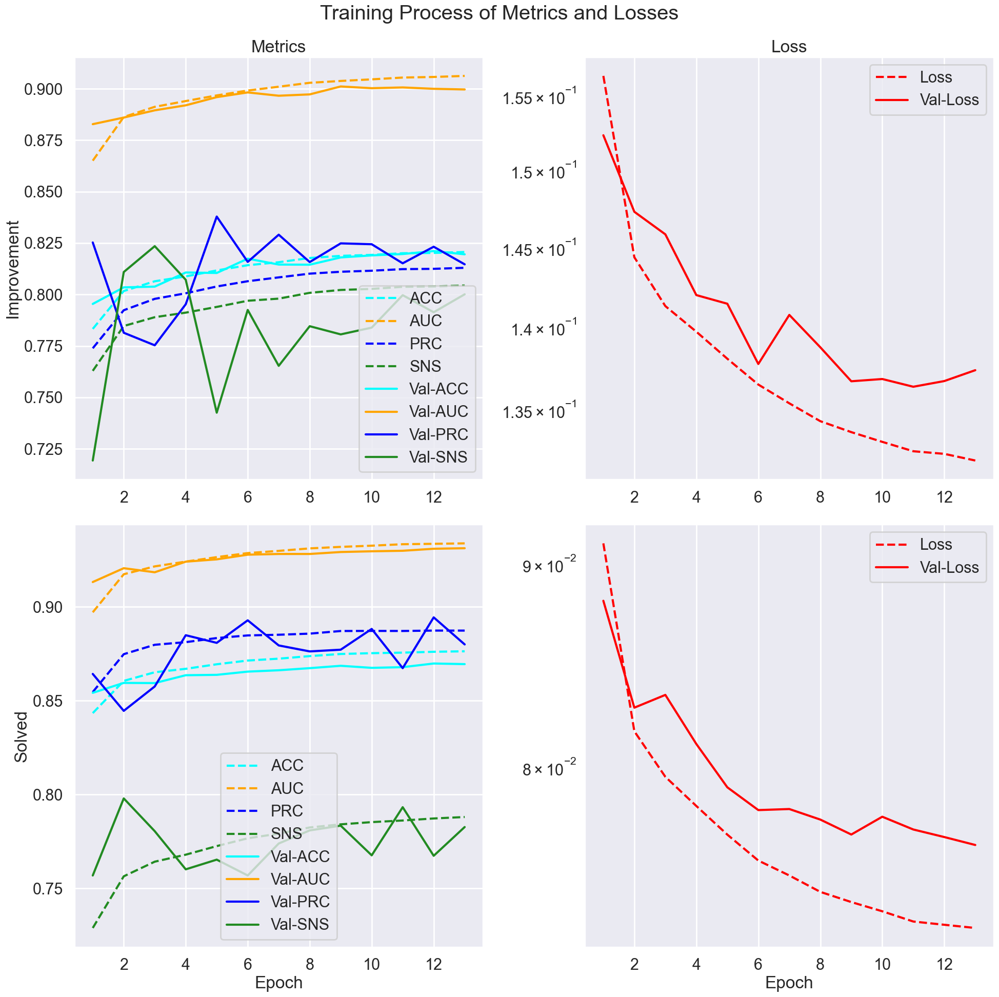

In [27]:
sns.set(context="poster")

clms = history.columns

fig, ax = plt.subplots(len(TARGET_LABELS), 2, figsize=(20, 10*len(TARGET_LABELS)))

colors = ["cyan", "orange", "blue", "forestgreen", "red", "purple"]

for i, target in enumerate(TARGET_LABELS):
    history.loc[(history.Target == target), (~clms.str.contains("Val-"))&(~clms.str.contains("Loss"))]\
        .plot(ax=ax[i, 0],ls = "--", color = colors, label = "Training")
    history.loc[(history.Target == target), (clms.str.contains("Val-"))&(~clms.str.contains("Loss"))]\
        .plot(ax=ax[i, 0], lw = 3, color = colors, label = "Validation")
    ax[i, 0].set(ylabel = target)

    # Plot the loss
    history.loc[(history.Target == target), (~clms.str.contains("Val-"))&(clms.str.contains("Loss"))]\
        .plot(ax=ax[i, 1], ls = "--", color = "red", label = "Training") 
    history.loc[(history.Target == target), (clms.str.contains("Val-"))&(clms.str.contains("Loss"))]\
        .plot(ax=ax[i, 1], lw = 3, color = "red", label = "Validation")
    ax[i, 1].set(yscale = "log")

ax[0, 0].set(
    title="Metrics",
    xlabel=""
)
ax[0, 1].set(
    title="Loss",
    xlabel=""
);


fig.suptitle("Training Process of Metrics and Losses")
fig.tight_layout()
plt.tight_layout()

for file_format in ["png", "jpg", "pdf", "svg"]:
    path = os.path.join(cwd, "plots", "2024-01-07-FinalModelTraining-Train+Val", f"LossByEpoch.{file_format}")
    plt.savefig(path)

sns.set(context="talk")

Tradeoff between Sensitivity and Precision can be seen very good here.
Most likely explanation:
- the bias of the final layer before the sigmoid has changed drastically.
- if the bias increases, predicted probabilities increase. This means more found solved cases and higher Sensitivity
- if the bias decreases, predicted probabilities decrease. This means less found solved cases, only the more certain cases. Higher Precision

### Visualize Attention Scores:

In [28]:
from utils.DNN.utils import get_attention_scores

#attention = get_attention_scores(model, model_inputs=cx, layer_name=f"transformer_encoder_{n_blocks-1}")
attention = get_attention_scores(model, model_inputs=cx, layer_name=f"transformer_encoder_4")
attention.shape
#cx[0][24].round(2)[:40]

(1024, 4, 80, 80)

In [29]:
get_attention_scores(model, model_inputs=cx, layer_name=f"transformer_encoder_4")

array([[[[0.1699256 , 0.01820401, 0.04875651, 0.04615488, 0.04474951, 0.03210247, 0.03210247, 0.06120975, 0.07295489, 0.02691779, 0.02691779, 0.05240901, 0.02005437, 0.03551219, 0.03551219, 0.04706848, 0.06055107, 0.00121123, 0.00108111, 0.02438573, 0.00136188, 0.00112845, 0.02442206, 0.00029558, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, ..., 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377, 0.00205377],
         [0.20234011, 0.01452816, 0.04813255, 0.04513418, 0.04352291, 0.02778546, 0.02778546, 0.06274103, 0.07690527, 0.02247079, 0.02247079, 0.07096551, 0.01641744, 0.0313279 , 0.0313279 , 0.04359885, 0.05854802, 0.00101411, 0.00082665, 0.02860232, 0.00122062, 0.

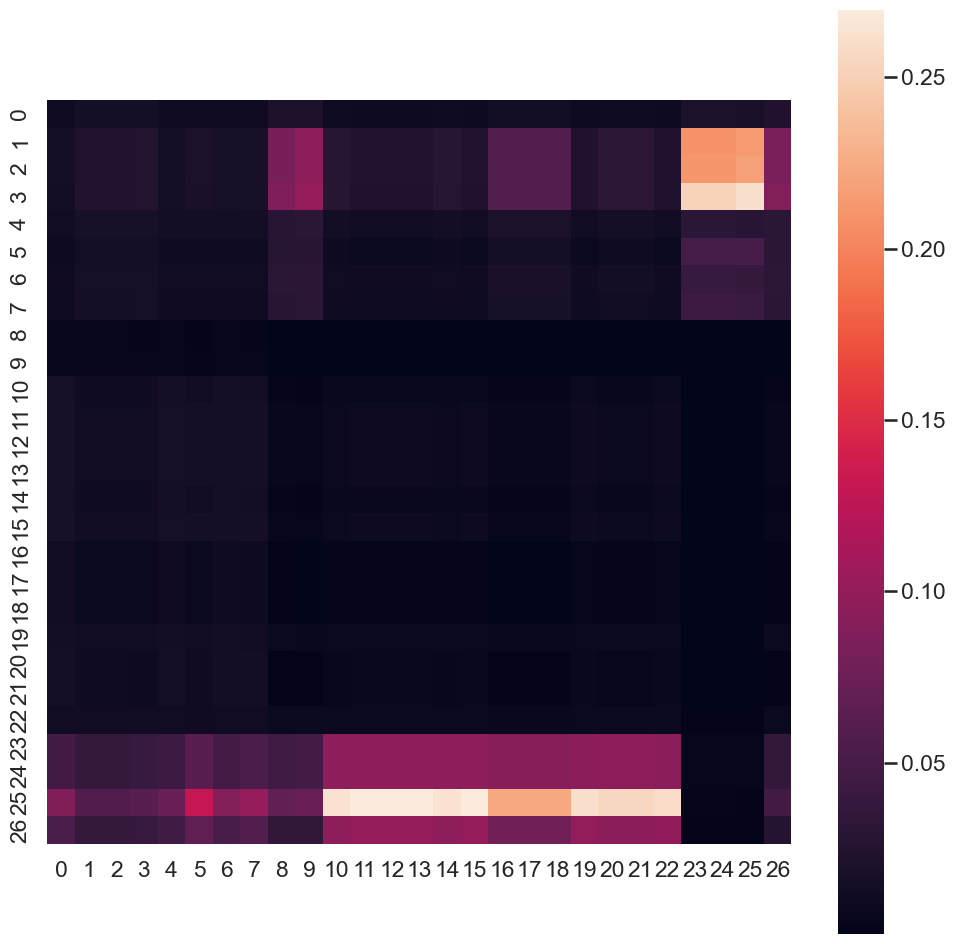

In [30]:
instance, head = 24, 1 # 18: 36 # 24 is a very simple but good example
head = min(head, num_heads-1)

attention_matrix = attention[instance, head, :, :]

# truncate:
n_inputs = np.argmax(np.all(cx[0][instance].round(2) == 0, axis=1))
attention_matrix = attention_matrix[:n_inputs, :n_inputs]

plt.figure(figsize=(12, 12))
sns.heatmap(attention_matrix.T,
            square=True,
            #vmin=0, vmax=1
           );

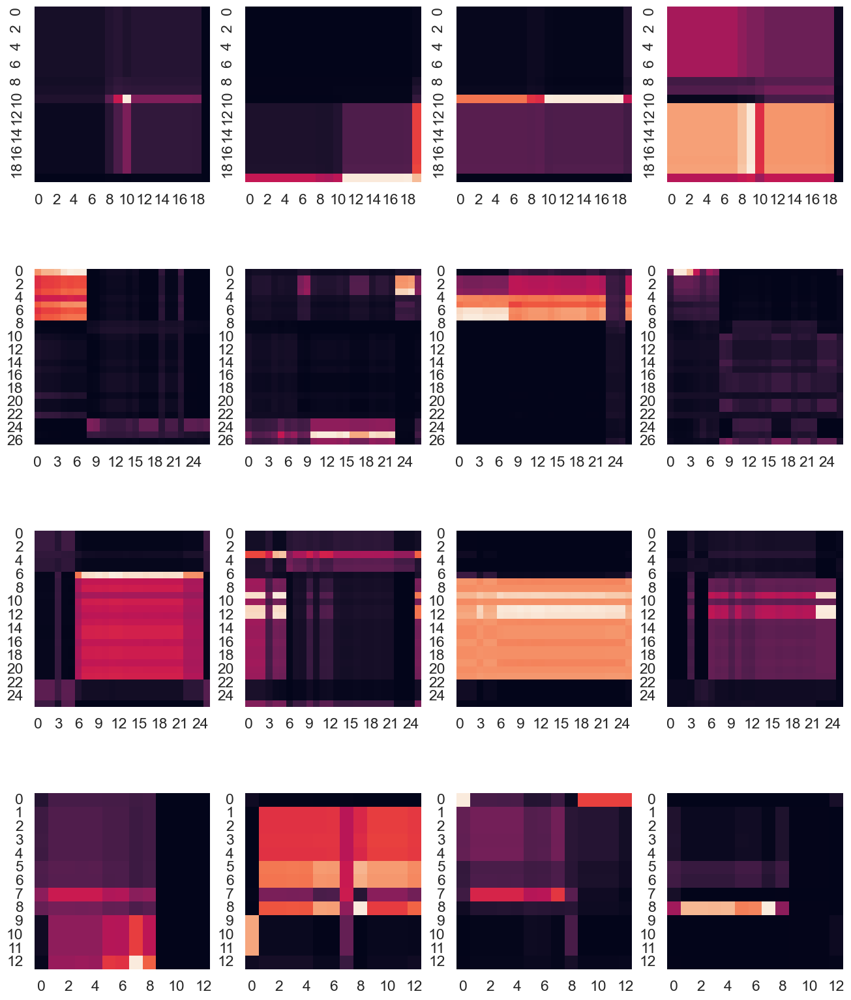

In [31]:
instances = [28, 24, 25, 26]

heads = list(range(num_heads))

fig, ax = plt.subplots(len(instances), num_heads, figsize=(16, len(instances)*5))

for i, instance in enumerate(instances):
    for h, head in enumerate(heads):

        # Truncate
        attention_matrix = attention[instance, head, :, :]
        n_inputs = np.argmax(np.all(cx[0][instance].round(2) == 0, axis=1))
        attention_matrix = attention_matrix[:n_inputs, :n_inputs]
        
        sns.heatmap(
            attention_matrix.T,
            square=True,
            cbar=False,
            #vmin=0, vmax=0.1,
            ax=ax[i, h]
        );

# Load the model to see if it works

In [32]:
model_path = os.path.join(cwd, "models", f"FinalModelTraining-Train+Val.tf")

#loaded_model = tf.keras.models.load_model(model_path)

In [33]:
y_pred = model(cx);

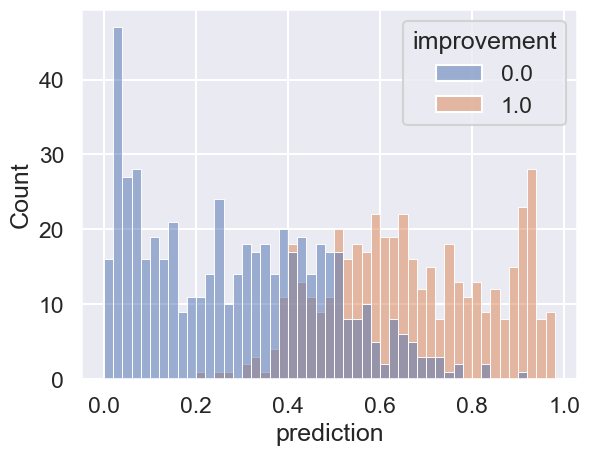

In [34]:
pred_df = data=pd.DataFrame([y_pred[0].numpy(), cy[1]]).T
pred_df.columns = ["prediction", "improvement"]

sns.histplot(
    data=pred_df,
    x="prediction",
    hue="improvement",
    bins=np.arange(0, 1, 0.02)
);

In [35]:
test_dataset = keras.preprocessing.text_dataset_from_directory(
    directory = test_samples,
    labels = None,
    batch_size = BATCH_SIZE,
    max_length = None,
    shuffle = True,
    seed = SEED,
)

Found 104591 files belonging to 1 classes.


In [36]:
_ = run_epoch(model, test_dataset, TARGET_LABELS, all_metrics, epoch=epoch, history=track, training=False, shuffle=True)

Validation-Iteration: 103/103	LR: 0.000257347                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [37]:
_

(<keras.src.engine.functional.Functional at 0x2a0735610>,
    Epoch       Target    Metric     Value
 0      1  Improvement       PRC  0.773869
 0      1  Improvement       SNS  0.762890
 0      1  Improvement       AUC  0.865039
 0      1  Improvement       ACC  0.783276
 0      1       Solved       PRC  0.854584
 ..   ...          ...       ...       ...
 0     13       Solved   Val-SNS  0.792818
 0     13       Solved   Val-AUC  0.936574
 0     13       Solved   Val-ACC  0.881519
 0     13  Improvement  Val-Loss  0.125276
 0     13       Solved  Val-Loss  0.071513
 
 [270 rows x 4 columns])

# Compare the relationship between solved and inproved instances

In [38]:
for X_val_raw in val_dataset:
    X_val, y_val = input_output_generation(
            X_val_raw,
            items=items,
            truck_stops=truck_stops,
            truck_dims=truck_dims,
            target_labels=TARGET_LABELS,
            shuffle=False,
            pad_size=PAD_SIZE
        )
    break

X_val_raw = X_val_raw.numpy().astype(str)

In [39]:
print(X_val_raw[0])

dataset: X
instance: TR6
+-----------+
2D Packing MIP with Time Limit 15 [s] in Truck P198425001
Stack 0 with items: ['0090017000_14062023042866', '0090017000_14062023035052', '0090017000_14062023035052']
Stack 1 with items: ['0090017000_14062023035052', '0090017000_14062023031401', '0090017000_14062023035052']
Stack 2 with items: ['0090017000_14062023031401', '0090017000_14062023031401', '0090017000_14062023031401']
Stack 3 with items: ['0090017000_14062023031401', '0090017000_14062023031214', '0090017000_14062023031214']
Stack 4 with items: ['0090017000_14062023031214', '0090017000_14062023025406', '0090017000_14062023011275']
Stack 5 with items: ['0090017000_14062023011275', '0090017000_14062023001720', '0090017000_14062023011275']
Stack 6 with items: ['0090017000_14062023001720']
Stack 7 with items: ['0090017000_14062023033056', '0090017000_14062023033056', '0090017000_14062023033056']
Stack 8 with items: ['0090017000_14062023033056', '0090017000_14062023022138', '0090017000_140620

In [40]:
X_val[0][0,:25]

array([[ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  1.557     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.195     ,  1.        ,  0.519     ,  0.        ,  0.        ,  1.        ,  0.        ,  0.04999995,  0.44000006],
       [ 1.4       ,  1.        ,  2.01      ,  0.        ,  0.        ,  1.        ,  0.        ,  1.0400001 ,  0.440

In [41]:
y_pred_solved, y_pred_improvement = model(X_val)
y_pred_solved, y_pred_improvement = y_pred_solved.numpy(), y_pred_improvement.numpy()

In [42]:
y_pred_solved[0]

0.3588108

In [43]:
y_pred_improvement[0]

0.12805262

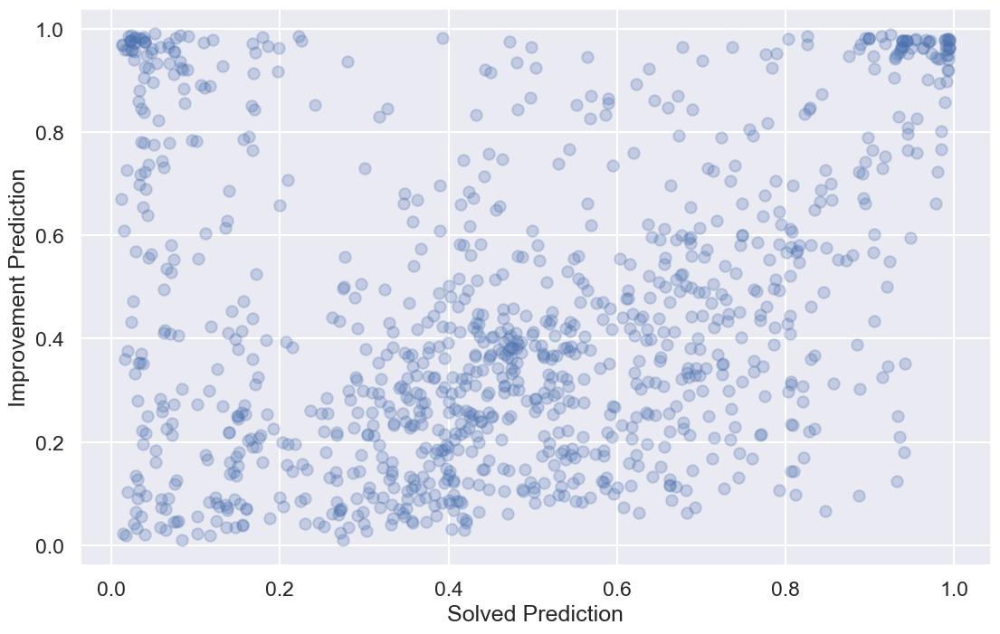

In [44]:
plt.figure(figsize=(13, 8))
plt.scatter(y_pred_solved, y_pred_improvement, alpha = 0.25);
plt.xlabel("Solved Prediction")
plt.ylabel("Improvement Prediction");

In [45]:
pd.crosstab(*y_val)

col_0,0.0,1.0
row_0,,
0.0,384,159
1.0,245,236


In [46]:
pd.crosstab(y_pred_solved.round(), y_pred_improvement.round())

col_0,0.0,1.0
row_0,,
0.0,420,153
1.0,249,202
